Here is the infinite dimensional weak form
$$
\int_{\Omega} \nabla A_{z} \cdot \nabla v\, dx = \int_{\Omega} \mu J_{z}v\,dx  
$$

In [24]:
from mshr import *
from fenics import *
import numpy as np 

In [25]:
R = 5.0 # radius of the domain, a disk
a = 1.0 # inner radius of the cylinder

In [26]:
domain = Circle(Point(0,0), R)
cylinder = Circle(Point(0,0), a)

In [27]:
# numebering and setting subdomains
domain.set_subdomain(1, cylinder)

In [28]:
mesh = generate_mesh(domain, 128)

V = FunctionSpace(mesh, "CG", 1)

def boundary(x, on_boundary):
    return on_boundary
bc = DirichletBC(V, Constant(0), boundary)

In [29]:
# creaste mesh function with unsigned integers corresponding to subdomain numbers
# with dimension 2, equal to the cell dimension
markers = MeshFunction('size_t', mesh, 2, mesh.domains())

# plot(markers, title="Subdomains")

In [30]:
J = Constant(1.0)

class Permeability(UserExpression): # UserExpression instead of Expression
    def __init__(self, markers, **kwargs):
        super().__init__(**kwargs) # This part is new!
        self.markers = markers
    def eval_cell(self, values, x, cell):
        if self.markers[cell.index] == 0:
            values[0] = 4*pi*1e-7 # vacuum
        elif self.markers[cell.index] == 1:
            values[0] = 1e-5      # iron, should be 2.5e-1
        else:
            values[0] = 1.26e-6   # copper

mu = Permeability(markers, degree=1)

In [31]:
A_z = TrialFunction(V)
v = TestFunction(V)

a = dot(grad(A_z), grad(v))*dx
L = J*v*mu*dx

A_z = Function(V)

solve(a==L, A_z, bc)

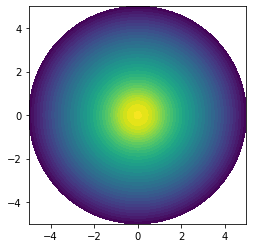

In [32]:
plot(A_z)

In [33]:
W = VectorFunctionSpace(mesh, "CG", 2)
# approximate the 
B = project(as_vector((A_z.dx(1), -A_z.dx(0))), W)

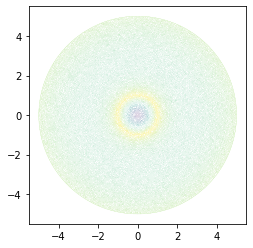

In [34]:
plot(B)

In [35]:
file_A_z = File("vector_potential.pvd")
file_A_z << A_z
file_B = File("field.pvd")
file_B << B